In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, TensorDataset
from PIL import Image
import os
import matplotlib.pyplot as plt
from get_image_paths import get_image_paths

In [2]:
import final

Using device: cuda


In [11]:
# Check if CUDA is available
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")

# Dataset constants
NUM_CLASSES = 21
IMAGE_SIZE = 128
NUM_TRAIN_PER_CAT = 70
DATA_PATH = '/users/student/pg/pg24/ritik/gnr/UCMerced_LandUse'
CATEGORIES = ['agricultural', 'airplane', 'baseballdiamond', 'beach', 'buildings', 'chaparral',
              'denseresidential', 'forest', 'freeway', 'golfcourse', 'harbor', 'intersection',
              'mediumresidential', 'mobilehomepark', 'overpass', 'parkinglot', 'river', 'runway',
              'sparseresidential', 'storagetanks', 'tenniscourt']

CATE2ID = {v: k for k, v in enumerate(CATEGORIES)}


Using device: cuda


In [4]:
model = final.HVAE()

In [5]:
model.load_state_dict(torch.load('best_hvae_model.pth'))

<All keys matched successfully>

In [12]:
train_image_paths, val_image_paths, test_image_paths, train_labels, val_labels, test_labels = get_image_paths(DATA_PATH, CATEGORIES, NUM_TRAIN_PER_CAT)
transform = transforms.Compose([
    transforms.Resize(IMAGE_SIZE),
    transforms.CenterCrop(IMAGE_SIZE),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])  # Scales to [-1, 1]
])

train_images = torch.stack([transform(Image.open(path).convert('RGB')) for path in train_image_paths])
train_labels_tensors = torch.tensor([CATE2ID[x] for x in train_labels])

test_images = torch.stack([transform(Image.open(path).convert('RGB')) for path in test_image_paths])
test_labels_tensors = torch.tensor([CATE2ID[x] for x in test_labels])

val_images = torch.stack([transform(Image.open(path).convert('RGB')) for path in val_image_paths])
val_labels_tensors = torch.tensor([CATE2ID[x] for x in val_labels])


In [13]:
def denormalize(tensor):
    # Undo normalization: x * std + mean
    mean = torch.tensor([0.5, 0.5, 0.5], device=tensor.device).view(1, 3, 1, 1)
    std = torch.tensor([0.5, 0.5, 0.5], device=tensor.device).view(1, 3, 1, 1)
    return tensor * std + mean

Class 0: 6 images collected
Class 1: 6 images collected
Class 2: 6 images collected
Class 3: 6 images collected
Class 4: 6 images collected
Class 5: 6 images collected
Class 6: 6 images collected
Class 7: 6 images collected
Class 8: 6 images collected
Class 9: 6 images collected
Class 10: 6 images collected
Class 11: 6 images collected
Class 12: 6 images collected
Class 13: 6 images collected
Class 14: 6 images collected
Class 15: 6 images collected
Class 16: 6 images collected
Class 17: 6 images collected
Class 18: 6 images collected
Class 19: 6 images collected
Class 20: 6 images collected


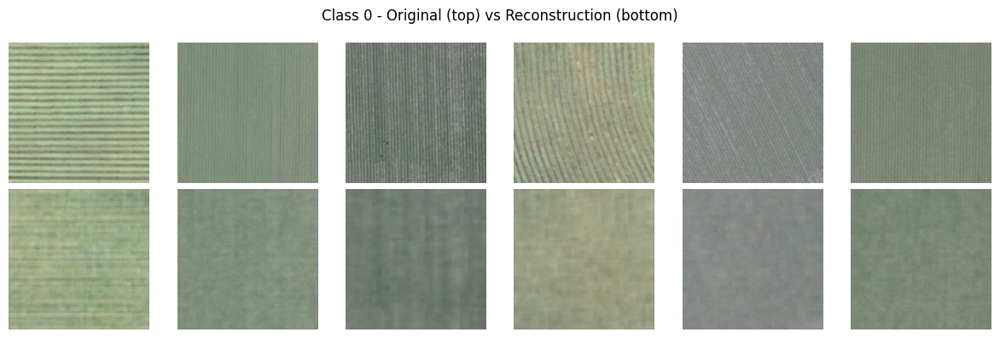

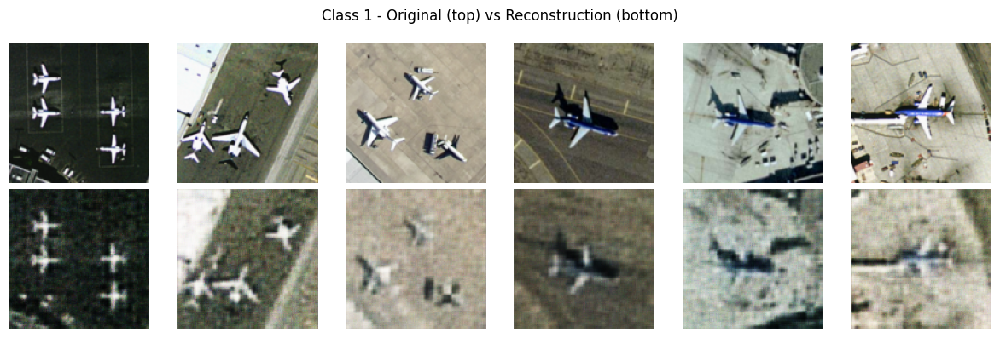

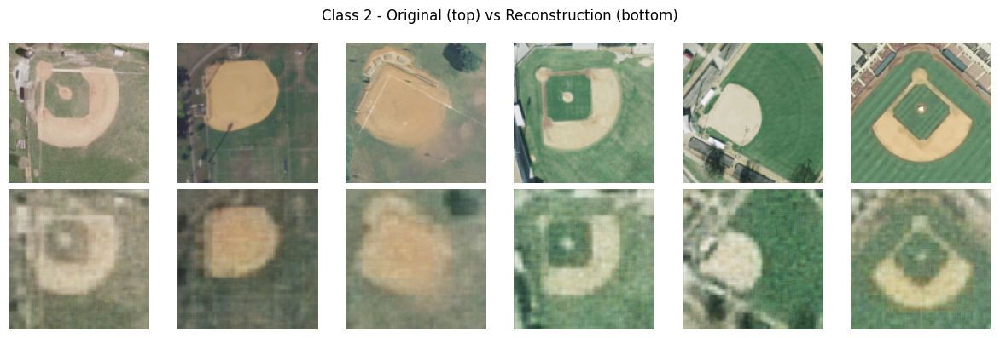

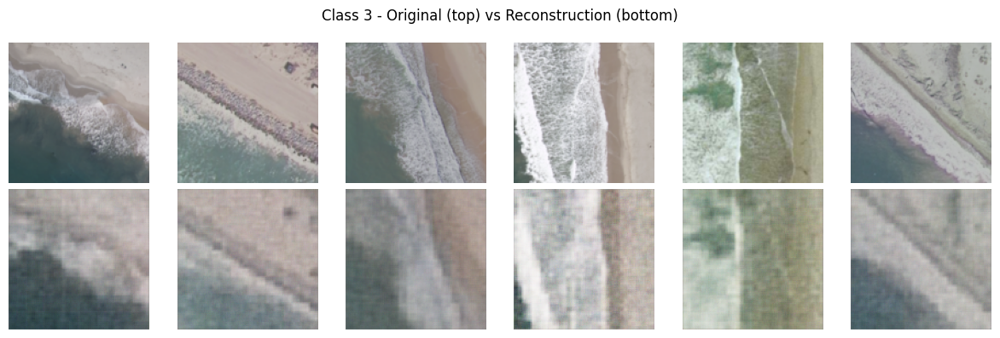

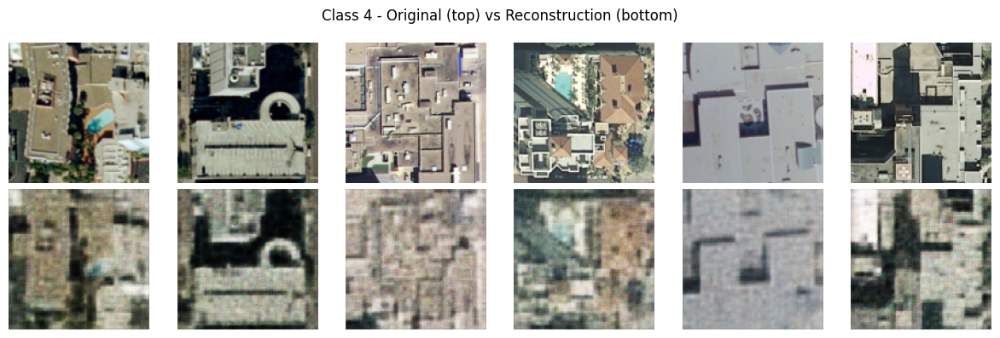

...

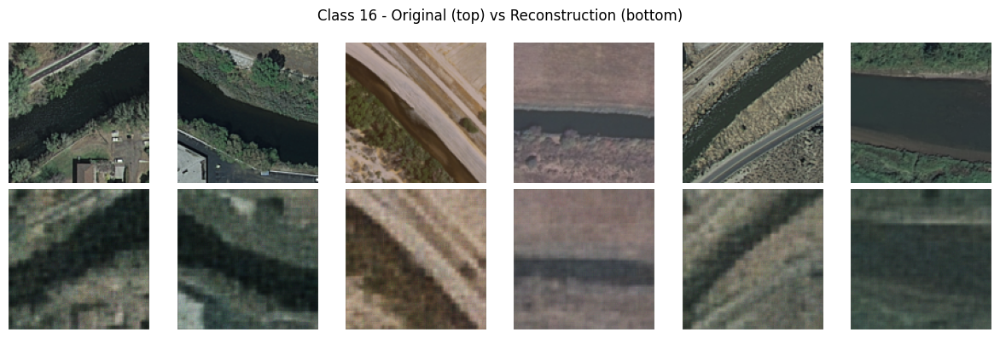

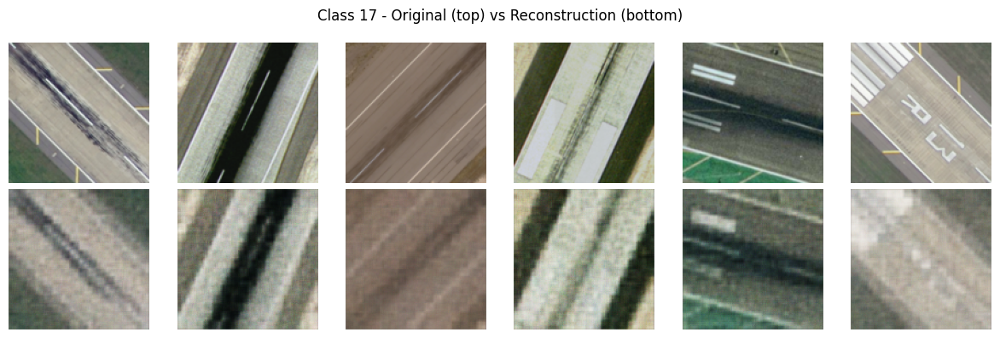

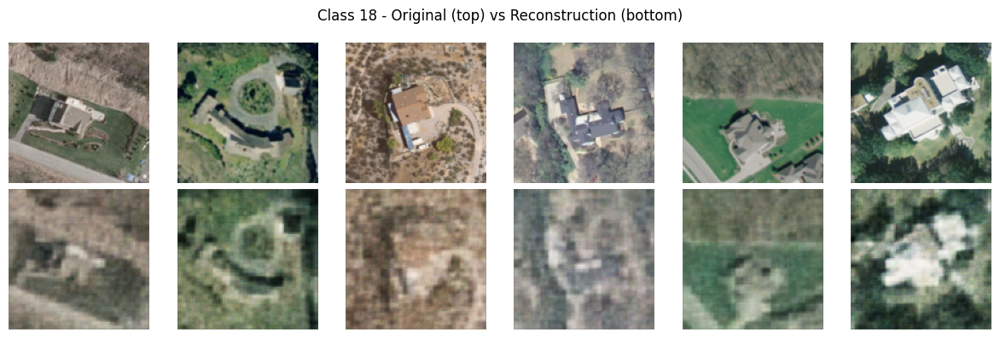

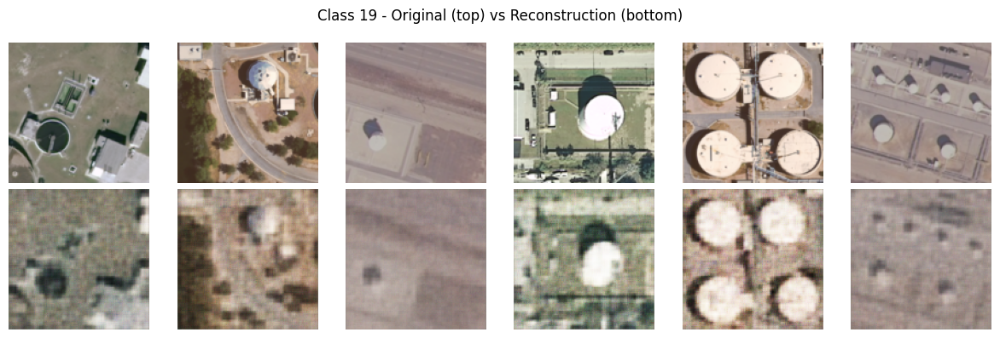

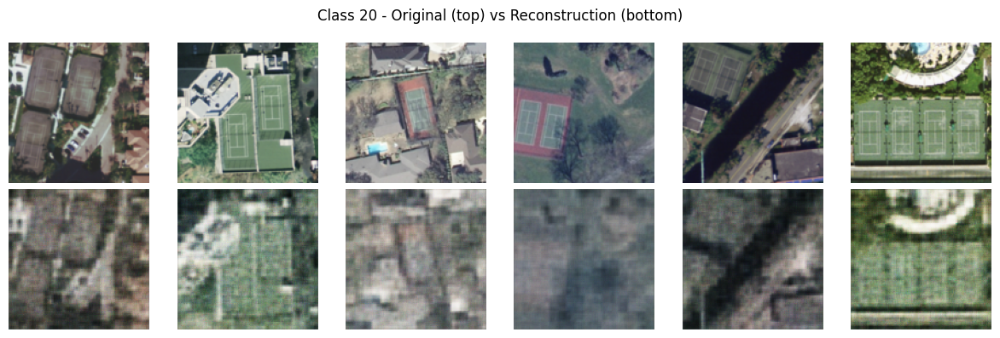

In [14]:
import matplotlib.pyplot as plt
from collections import defaultdict

model.to(device)
model.eval()

# Step 1: Group up to 6 test images per class
num_classes = 21
class_images = defaultdict(list)

for img, lbl in zip(train_images, train_labels_tensors):
    lbl = lbl.item()
    if len(class_images[lbl]) < 6:
        class_images[lbl].append(img)

# Optional: check counts
for i in range(num_classes):
    print(f"Class {i}: {len(class_images[i])} images collected")

# Step 2: Plot original vs reconstruction for each class
for class_idx in range(num_classes):
    if len(class_images[class_idx]) < 6:
        print(f"Skipping class {class_idx}, only {len(class_images[class_idx])} images found.")
        continue

    images = torch.stack(class_images[class_idx]).to(device)

    with torch.no_grad():
        recons = model.generate(images)

    # Denormalize (from [-1,1] to [0,1])
    def denormalize(x):
        return x * 0.5 + 0.5

    images = denormalize(images)
    recons = denormalize(recons)

    plt.figure(figsize=(12, 4))
    for i in range(6):
        # Original
        ax = plt.subplot(2, 6, i + 1)
        plt.imshow(images[i].permute(1, 2, 0).cpu().numpy())
        ax.axis("off")

        # Reconstruction
        ax = plt.subplot(2, 6, i + 7)
        plt.imshow(recons[i].permute(1, 2, 0).cpu().numpy())
        ax.axis("off")

    plt.suptitle(f"Class {class_idx} - Original (top) vs Reconstruction (bottom)")
    plt.tight_layout()
    #plt.savefig(f"reconstruction_class_{class_idx}.png")
    plt.show()
